# Saliency

https://www.robots.ox.ac.uk/~vgg/research/affine/det_eval_files/kadir04.pdf

## Entropy $$H(s,x) = - \int p(I,s,x)\log_2(p(I,s,x)) dI$$

Discrete Version:  $$H(x) = - \sum_x p(x)\log_2(p(x))$$
Measure of information content for a distribution $p$
- $H(p)$ is maximal for uniform distribution: $p(x_i)=p(x_j) ~~ \forall i,j$ 
- $H(p)$ is minimal for a homogeneous patch: $\exists! i: p(x_i)= 1$ $p(x_j) ~~ \forall i\neq j$ 

## Weight $$W(s,x) = s \int \left|\frac{d}{ds}p(I,s,x)\right|dI$$

## Local Maximum $$s_p =  s: \left\{ \frac{d}{ds}H(s,x)=0 , \frac{d^2}{ds^2}H(s,x)<0 \right\}$$

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import entropy

(315, 600)


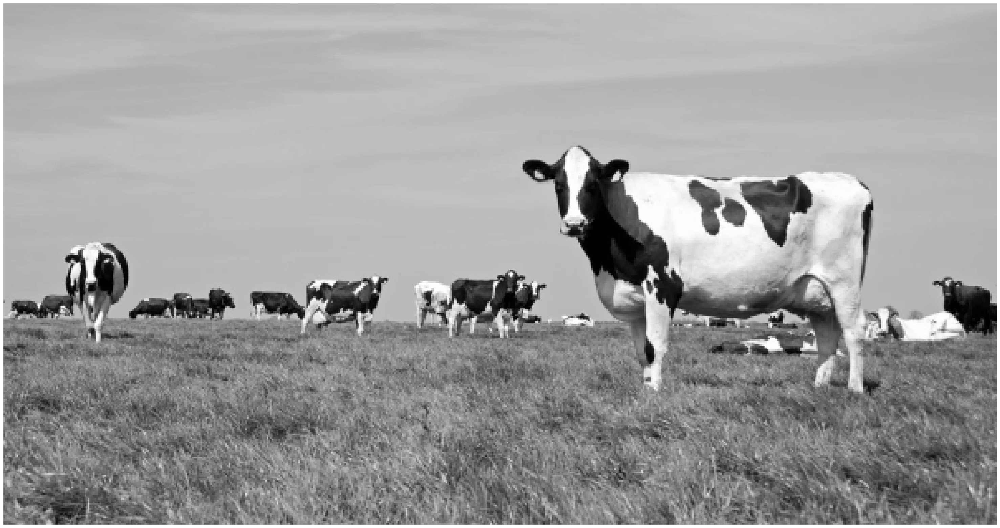

In [2]:
img = cv.imread("cows.jpg", cv.IMREAD_GRAYSCALE)
img = cv.resize(img, (img.shape[1]//2,img.shape[0]//2), 0.5)

def showImages(imgs, cols=10, rows=1, cmap="gray"):
    fig=plt.figure(figsize=(80, 20))
    for i, img in enumerate(imgs, 1):
        fig.add_subplot(rows, cols, i, )
        plt.imshow(img, cmap = cmap)
        plt.axis('off')
    plt.show()
    
print(img.shape)
showImages([img],1,1)

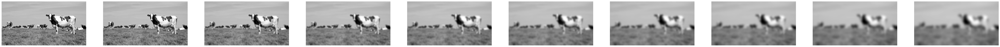

In [3]:
scales = [img] + [cv.GaussianBlur(img, (101,101), s) for s in range(1, 10)]
showImages(scales)

$$H(s,x) = - \int p(I,s,x)\log_2(p(I,s,x)) dI$$

In [4]:
def histogram_image(img, d = 5):
    
    rows, cols = img.shape
    result = np.zeros((rows, cols, 256))
    
    for i in range(rows):
        for j in range(cols):
            
            low_y = max(0, i-d)
            low_x = max(0, j-d)
            
            high_y = min(rows, i+d)
            high_x = min(cols, j+d)
            
            hist = cv.calcHist([img[low_y:high_y,low_x:high_x]] , [0], None, [256], [0,256])
            result[i,j, :] = hist.flatten()
    return result

In [5]:
histograms = [histogram_image(img) for img in scales]

In [6]:
def H_D(histogram):
    
    rows, cols = histogram.shape[:2]
    result = np.zeros((rows, cols))
    
    for i in range(rows):
        for j in range(cols):
            result[i,j] = entropy(histogram[i,j,:], base = 2)
    return result

In [7]:
H_ds = [H_D(histogram) for histogram in histograms]

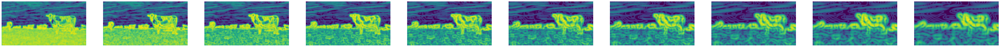

In [8]:
showImages(H_ds, cmap="viridis")

$$W(s,x) = s \int \left|\frac{d}{ds}p(I,s,x)\right|dI$$

In [9]:
def W_D(histograms):
    
    weights = []
    
    for i in range(1, len(histograms)-1):
        hist_left = histograms[i-1]
        hist_right = histograms[i+1]
        W =  np.abs(hist_right-hist_left).sum(2)
        weights.append(W)
    return weights

In [10]:
W_ds = W_D(histograms)

In [11]:
W_ds = [np.zeros(img.shape)]+ W_ds + [np.zeros(img.shape)]

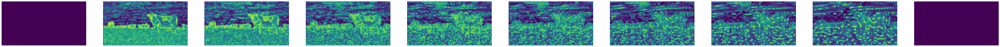

In [12]:
showImages(W_ds, cmap ="viridis")

$$s_p =  \left\{s:  \frac{d}{ds}H(s,x)=0 , \frac{d^2}{ds^2}H(s,x)<0 \right\}$$

In [13]:
def S_p(H_imgs):
    eps = 0.05
    masks = []
    for i in range(1,len(H_imgs)-1):
        H_s = np.abs(H_imgs[i+1]-H_imgs[i-1])
        H_ss = -2.0*H_imgs[i] +H_imgs[i+1] +H_imgs[i-1]
        
        masks.append(((H_s < eps) & (H_ss<0)).astype(float))
    return masks

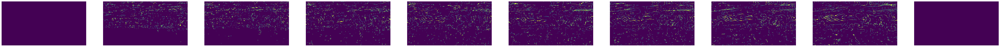

In [14]:
S_ds = [np.zeros(img.shape)] + S_p(H_ds) + [np.zeros(img.shape)]
showImages(S_ds, cmap ="viridis")

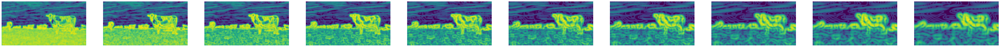

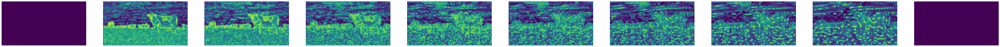

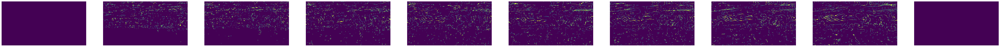

In [15]:
showImages(H_ds, cmap ="viridis")
showImages(W_ds, cmap ="viridis")
showImages(S_ds, cmap ="viridis")

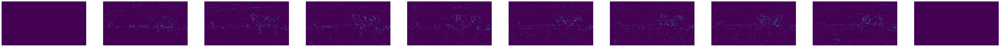

In [16]:
saliency = [H*W*S for H,W,S in zip(H_ds,W_ds,S_ds)]
showImages(saliency,cmap ="viridis" )

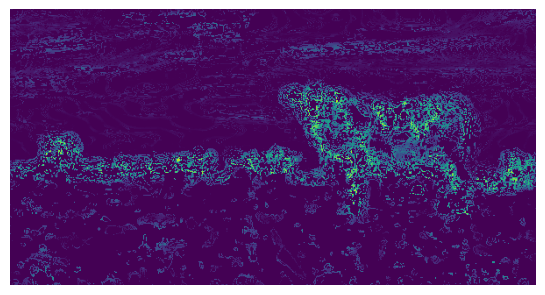

In [17]:
showImages([np.stack(saliency).max(0)], cmap="viridis" )

In [18]:
def nonMaxSuprression(img, d=5):
    rows,cols = img.shape
    result = np.zeros((rows,cols))
    for i in range(rows):
        for j in range(cols):
            low_y = max(0, i-d)
            low_x = max(0, j-d)
            
            high_y = min(rows, i+d) 
            high_x = min(cols, j+d) 
            
            max_val = img[low_y:high_y,low_x:high_x].max()
            
            if img[i,j] == max_val:
                result[i,j] = max_val
    return result

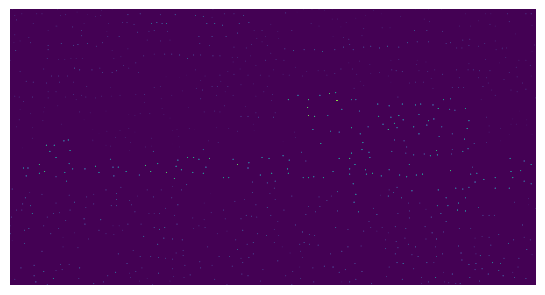

In [25]:
saliency_map = nonMaxSuprression(np.stack(saliency).max(0))
showImages([saliency_map], cmap="viridis")

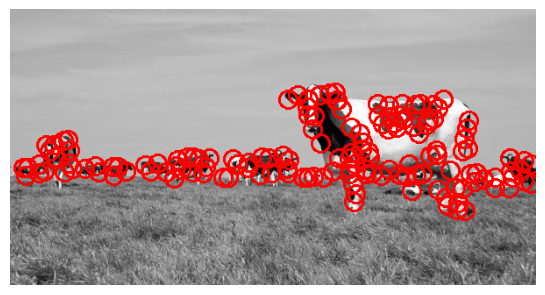

In [26]:
n = 150
coords = zip(*np.unravel_index(np.argpartition(saliency_map, -n, axis=None)[-n:], saliency_map.shape))
vis = np.stack([img, img, img], 2)

for y,x in coords:
    vis = cv.circle(vis, (x,y) , 10, (255,0,0), 2)
    
showImages([vis])

In [27]:
def nonMaxSuprression3D(img, d=5):
    scales, rows,cols = img.shape
    result = np.zeros_like(img)
    for i in range(2*d,rows-2*d):
        for j in range(2*d,cols-2*d):
            low_y = max(0, i-d)
            low_x = max(0, j-d)
            
            high_y = min(rows, i+d) 
            high_x = min(cols, j+d) 
            
            max_val = img[:,low_y:high_y,low_x:high_x].max()
            
            is_max = np.abs(img[:,i,j] - max_val) < 0.0000001
            result[:,i,j] = max_val*is_max
    return result

In [22]:
print(np.stack(saliency).shape)

(10, 315, 600)


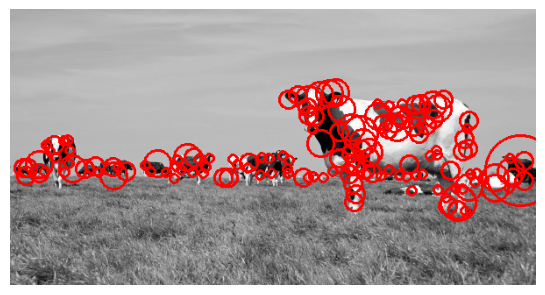

In [28]:
saliency_map = np.stack(saliency)
saliency_map = nonMaxSuprression3D(np.stack(saliency))
n= 150
coords = zip(*np.unravel_index(np.argpartition(saliency_map, -n, axis=None)[-n:], saliency_map.shape))
vis = np.stack([img,img,img],2)
for s,y,x in coords:
    vis = cv.circle(vis,(x,y), s*5, (255,0,0), 2)
showImages([vis])